# FIT1043 Introduction to Data Science
## Assignment 2

Daisuke Murakami

32729286

# Introduction

This assignment focusses on a dataset derived from a set of essays provided in Kaggle, with various features of essays provided as sorted data with columns. The aim of this report is to conduct a predictive analysis on the data using machine learning. 

The following is the list of content of the report that will be shown:

1. Introduction
2. Importing Libraries
3. Reading the CSV files 
4. Data Classification
5. Conclusion

The report skips data Wrangling because the provided data wa salready pre-processed. 

# Importing Libraries

This section imports the necessary libraries to perform data collection, data analysis, data visualization, and data modelling.

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from sklearn.metrics import confusion_matrix
from sklearn.metrics import cohen_kappa_score as cks
from sklearn.metrics import classification_report
from matplotlib.colors import ListedColormap
from sklearn.preprocessing import StandardScaler
from sklearn.svm import LinearSVR
from sklearn.model_selection import train_test_split
from sklearn.pipeline import make_pipeline
from sklearn.metrics import accuracy_score, r2_score, explained_variance_score, mean_absolute_error
from sklearn import svm
from sklearn.datasets import make_blobs
from sklearn.svm import SVC, SVR
from sklearn.linear_model import LinearRegression
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

# Reading CSV files

This section uses the pandas library to implement the csv data as dataframes using pd.read_csv()


In [2]:
df = pd.read_csv('FIT1043-Essay-Features.csv')
df_sub = pd.read_csv('FIT1043-Essay-Features-Submission.csv')
df_pred = pd.read_csv("32729286-DaisukeMurakami-1.csv")

To check if the dataframe was correctly implemented or not, head() function is performed to visualize the first 5 rows of the table data. 

In [3]:
df.shape, df_pred.shape

((1332, 19), (199, 2))

The shape function shows the format of the dataframe, where in the case of Essay-Features, there are **1332 rows** and **19 columns**

In [4]:
len(df.columns)

19

The columns function shows the list of columns that categorize the dataframe.

In [5]:
df.describe()

,essayid,chars,words,commas,apostrophes,punctuations,avg_word_length,sentences,questions,avg_word_sentence,POS,POS/total_words,prompt_words,prompt_words/total_words,synonym_words,synonym_words/total_words,unstemmed,stemmed,score
count,1332.00000,1332.000000,1332.000000,1332.000000,1332.000000,1332.00000,1332.000000,1332.000000,1332.000000,1332.000000,1332.000000,1332.000000,1332.000000,1332.000000,1332.00000,1332.000000,1332.000000,1332.000000,1332.000000
mean,905.27027,2101.745495,424.485736,14.667417,8.141141,0.47973,4.939762,19.704204,1.222973,23.884687,420.596542,0.989935,198.913664,0.469164,110.16967,0.263846,468.987988,455.507508,3.427177
std,526.68760,865.963750,171.873730,10.920781,6.124520,1.27168,0.231071,19.202731,1.847446,11.160020,170.985111,0.007308,82.729266,0.052466,43.96192,0.038870,159.447449,155.751220,0.774275
min,0.00000,169.000000,36.000000,0.000000,2.000000,0.00000,2.231322,0.000000,0.000000,1.084112,35.647059,0.924771,14.000000,0.288889,11.00000,0.027299,48.000000,50.000000,1.000000
25%,442.75000,1527.250000,310.000000,7.000000,4.000000,0.00000,4.791679,13.000000,0.000000,19.142857,305.406284,0.987758,144.000000,0.435709,81.00000,0.238423,361.000000,350.750000,3.000000
50%,914.50000,2029.500000,411.000000,13.000000,6.000000,0.00000,4.946059,18.000000,1.000000,22.030331,406.982869,0.991572,193.000000,0.465852,107.50000,0.262872,463.000000,448.000000,3.000000
75%,1369.75000,2613.500000,525.000000,21.000000,11.000000,0.00000,5.092938,24.000000,2.000000,26.048234,520.739458,0.994425,246.000000,0.500000,134.00000,0.288277,581.000000,561.250000,4.000000
max,1799.00000,6142.000000,1170.000000,72.000000,51.000000,26.00000,5.681429,642.000000,17.000000,303.000000,1158.984563,1.000000,669.000000,0.961207,355.00000,0.465517,750.000000,750.000000,6.000000


The describe() function visualizes the dataframe showing its descriptions. In the case of "FIT1043-Essay-Features.csv," we can see that the average word counts of all essays are 424.5 words. 

The code below uses seaborn to visualize the relationship between each features to understand how each components interact with each other

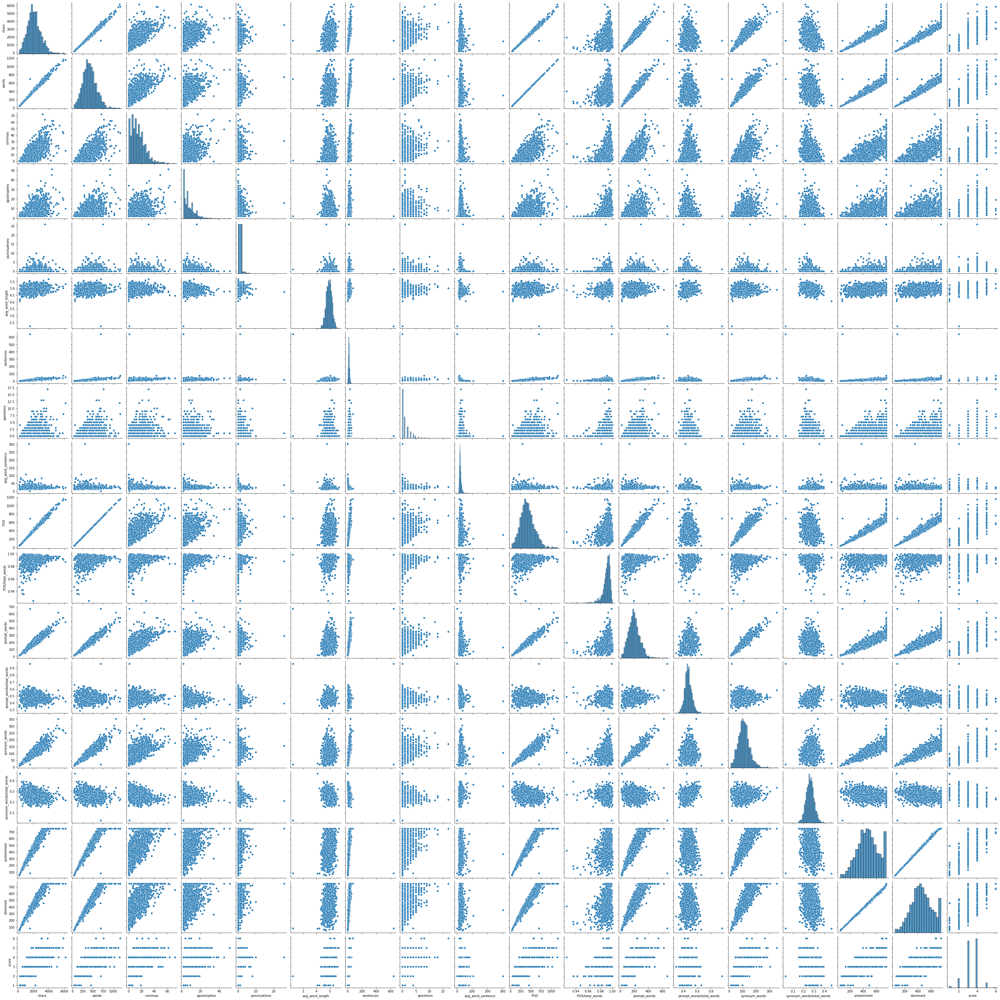

In [6]:
df2 = df.drop(columns=["essayid"])
sns.pairplot(df2)

As the above plots show, if we focus on the score component either for its vertical axis or horizontal axis, we can see that there is a correlation between some features and the score. However, we can also observe that every plot is wide spread, which can influence the accuracy of the linear regression method, because every data varies widely upon its components.  

## Description of the data
Before adapting the machine learning models to this task, the described data above should be analyzed in terms of visualized data. In this case, I have implemented boxplots to understand how each features stand out in terms of its average and its correlation between other parameters. 

Text(0, 0.5, 'score')

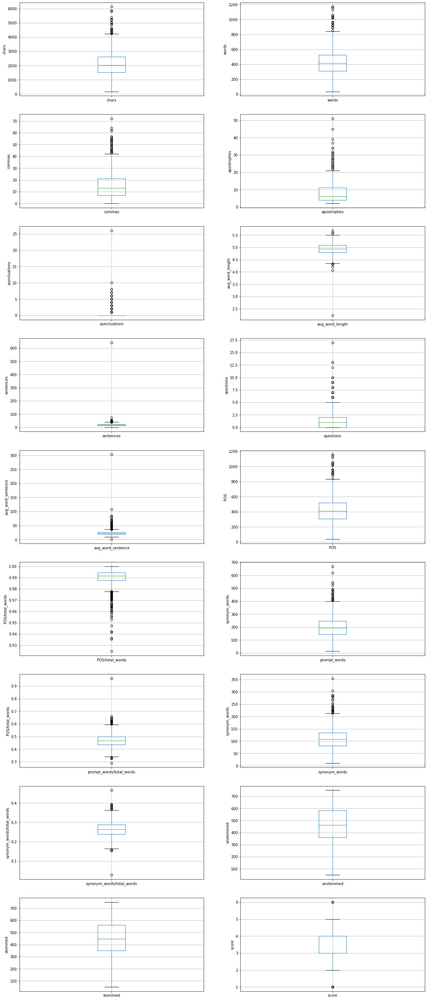

In [7]:
# Drawing a box plot
plt.figure(figsize=(20,50))

plt.subplot(9, 2, 1)
fig = df.boxplot(column='chars')
fig.set_title('')
fig.set_ylabel('chars')

plt.subplot(9, 2, 2)
fig = df.boxplot(column="words")
fig.set_title('')
fig.set_ylabel('words')

plt.subplot(9, 2, 3)
fig = df.boxplot(column="commas")
fig.set_title('')
fig.set_ylabel('commas')

plt.subplot(9, 2, 4)
fig = df.boxplot(column="apostrophes")
fig.set_title('')
fig.set_ylabel('apostrophes')

plt.subplot(9, 2, 5)
fig = df.boxplot(column="punctuations")
fig.set_title('')
fig.set_ylabel('punctuations')

plt.subplot(9, 2, 6)
fig = df.boxplot(column='avg_word_length')
fig.set_title('')
fig.set_ylabel('avg_word_length')

plt.subplot(9, 2, 7)
fig = df.boxplot(column='sentences')
fig.set_title('')
fig.set_ylabel('sentences')

plt.subplot(9, 2, 8)
fig = df.boxplot(column="questions")
fig.set_title('')
fig.set_ylabel('questions')

plt.subplot(9, 2, 9)
fig = df.boxplot(column="avg_word_sentence")
fig.set_title('')
fig.set_ylabel('avg_word_sentence')

plt.subplot(9, 2, 10)
fig = df.boxplot(column='POS')
fig.set_title('')
fig.set_ylabel("POS")

plt.subplot(9, 2, 11)
fig = df.boxplot(column='POS/total_words')
fig.set_title('')
fig.set_ylabel('POS/total_words')

plt.subplot(9, 2, 12)
fig = df.boxplot(column='prompt_words')
fig.set_title('')
fig.set_ylabel('synonym_words')

plt.subplot(9, 2, 13)
fig = df.boxplot(column='prompt_words/total_words')
fig.set_title('')
fig.set_ylabel('POS/total_words')

plt.subplot(9, 2, 14)
fig = df.boxplot(column='synonym_words')
fig.set_title('')
fig.set_ylabel('synonym_words')

plt.subplot(9, 2, 15)
fig = df.boxplot(column="synonym_words/total_words")
fig.set_title('')
fig.set_ylabel('synonym_words/total_words')

plt.subplot(9, 2, 16)
fig = df.boxplot(column="unstemmed")
fig.set_title('')
fig.set_ylabel('unstemmed')

plt.subplot(9, 2, 17)
fig = df.boxplot(column="stemmed")
fig.set_title('')
fig.set_ylabel('stemmed')

plt.subplot(9, 2, 18)
fig = df.boxplot(column="score")
fig.set_title('')
fig.set_ylabel('score')

Since continuous variables mostly contain outliers in their data, this box plot clearly illustrates the outliers that exist in the provided data. If we observe more precisely, we can see that the median and the lower-quartile for the score feature is very close. However, just by looking at this graphs, we won't be able to justify how much the data is distributed among themselves. So, I will create a histogram to clarify the distribution of the data.

Text(0, 0.5, 'Number of points')

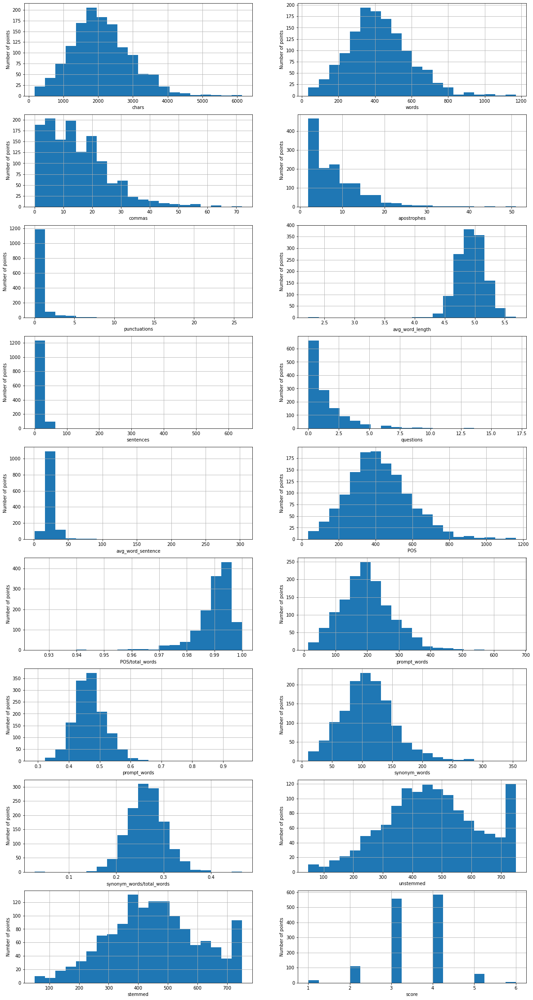

In [8]:
# Drawing a box plot
plt.figure(figsize=(20,40))

plt.subplot(9, 2, 1)
fig = df['chars'].hist(bins=20)
fig.set_xlabel('chars')
fig.set_ylabel('Number of points')

plt.subplot(9, 2, 2)
fig = df['words'].hist(bins=20)
fig.set_xlabel('words')
fig.set_ylabel('Number of points')

plt.subplot(9, 2, 3)
fig = df['commas'].hist(bins=20)
fig.set_xlabel('commas')
fig.set_ylabel('Number of points')

plt.subplot(9, 2, 4)
fig = df['apostrophes'].hist(bins=20)
fig.set_xlabel('apostrophes')
fig.set_ylabel('Number of points')

plt.subplot(9, 2, 5)
fig = df['punctuations'].hist(bins=20)
fig.set_xlabel('punctuations')
fig.set_ylabel('Number of points')

plt.subplot(9, 2, 6)
fig = df['avg_word_length'].hist(bins=20)
fig.set_xlabel('avg_word_length')
fig.set_ylabel('Number of points')

plt.subplot(9, 2, 7)
fig = df['sentences'].hist(bins=20)
fig.set_xlabel('sentences')
fig.set_ylabel('Number of points')

plt.subplot(9, 2, 8)
fig = df['questions'].hist(bins=20)
fig.set_xlabel('questions')
fig.set_ylabel('Number of points')

plt.subplot(9, 2, 9)
fig = df['avg_word_sentence'].hist(bins=20)
fig.set_xlabel('avg_word_sentence')
fig.set_ylabel('Number of points')

plt.subplot(9, 2, 10)
fig = df['POS'].hist(bins=20)
fig.set_xlabel('POS')
fig.set_ylabel('Number of points')

plt.subplot(9, 2, 11)
fig = df['POS/total_words'].hist(bins=20)
fig.set_xlabel('POS/total_words')
fig.set_ylabel('Number of points')

plt.subplot(9, 2, 12)
fig = df['prompt_words'].hist(bins=20)
fig.set_xlabel('prompt_words')
fig.set_ylabel('Number of points')

plt.subplot(9, 2, 13)
fig = df['prompt_words/total_words'].hist(bins=20)
fig.set_xlabel('prompt_words')
fig.set_ylabel('Number of points')

plt.subplot(9, 2, 14)
fig = df['synonym_words'].hist(bins=20)
fig.set_xlabel('synonym_words')
fig.set_ylabel('Number of points')

plt.subplot(9, 2, 15)
fig = df['synonym_words/total_words'].hist(bins=20)
fig.set_xlabel('synonym_words/total_words')
fig.set_ylabel('Number of points')

plt.subplot(9, 2, 16)
fig = df['unstemmed'].hist(bins=20)
fig.set_xlabel('unstemmed')
fig.set_ylabel('Number of points')

plt.subplot(9, 2, 17)
fig = df['stemmed'].hist(bins=20)
fig.set_xlabel('stemmed')
fig.set_ylabel('Number of points')

plt.subplot(9, 2, 18)
fig = df['score'].hist(bins=20)
fig.set_xlabel('score')
fig.set_ylabel('Number of points')

The histogram above shows the data in the form where it has the features of the dataframes as its x-axis, and the number or the amount of data relevant to that feature on its y-axis. For example for "chars," we can see the most essays have around 2000 characters in total, but we only see a little amount of essays that wrote 6000 characters. Since most of these visualized data are skewed we can say that the data isn't well distributed. Skewed data is significant when it comes to performing a regression model, this is because it has a bias relation between the components. What is meant here is that linear regression explores the normality of the data, so if the histogram distributed from the middle, it means that the relationship is proportionate, though in skewed data it is different. It contrasts because teh relationship becomes disproportionate which influence the estimated data to be biased towards the skewed side. Therefore, skewed data may influence the regression module negatively, by pulling hte regression line towards the more biased side. 

# Classification
Data classification is a type of supervised learning method with the process of predicting the outcomes from the discrete inputs. Classification can be described into 2 types, and those are binary classification and multi-class classification. It is known to be used to manage data governance policies and to detect sensitive folders that were directly installed from the browser. 

## Purpose of Supervised Learning

Supervised learning is one of the machine learning method where the model gets trained on labelled sets of data. This is where the sets of data includes both parameters of inputs and outputs. This algorithm is trained on some dataset, and has its purpose of producing alternative examples by creating functions.

## Difference between binary and multi-class classification

Before performing the data analysis, the difference between multi-class classification and binary classification needs to be mentioned. Firstly, binary classification is a classification method that classifies given elements from a data set into two separate groups. For instance, we can classify if whether if someone has a cancer or not by a method that shows the resulting outcome as "True" or "False", or by using "Yes" and "No".

On the other hand, multi-class classification is a type of classification method that classified elements in a provided sets of data into multiple categories or groups. For example, we can classify types of currency as Dollars, Yen, Ringgit, Pounds, Euro, and etc. Seeing this, we can generelly interpret that the multi-class classification method has more complexity than binary classification because it can categorize data into more output groups, which improves the details of the data.  

### Normalization of data for Support Vector Machine (SVM).
The code below uses StandardScaler() function, which was imported from the sklearn.preprocessing library. The standardscaler function normalizes the features of the dataframe individualy, which in this case features can be columns of the training data. It standardizes the data by using 0 and 1.

Throughout the normalization of the data, different functions are used separately for train data and the test data.
The reason why we adapt fit_transform() to our training data is because it performs both fit() and transform() function at once. The fit method calculates the mean and variance of each features of the present data. Additionaly, the transform function transforms all the features with respect to the mean and variance. For transform() function, the method can use the same mean and variance calculated before-hand in the fit_transform method. Thus, the educated or the learnt parameters by the model can use the training data to transform the test data. 

## Training Datasets 
To train our datasets we can separate the original data into two types. Training and testing datasets, which is crucial when educating the machine learning models, because we are performing a supervised learning method. 

The final test data which is "FIT1043-Essay-Features-Submission.csv" were assigned as "df_sub." This was assigned as a new dataset to implement the data as the final outcome of the predicted scores for each essays. 

In [9]:
# Determine X and y variables / Separation of features
X = df.iloc[:, [1,2,3,10,12,14,17,16]]
#[1,2,10,17,16]
y = np.array(df['score']) #Separate score from other features.
# Since the shape of y had no attributes for its columns, 
# the shape has been expanded using expand_dims()
y = np.expand_dims(y, -1) 
X_pred = df_sub.iloc[:, [1,2,3,10,12,14,17,16]]
#[1,2,6,11,14,15,16]

In [10]:
#Check of the shapes are correctly implemented or not
y.shape, X.shape, X_pred.shape

((1332, 1), (1332, 8), (199, 8))

In [11]:
# Split the dataset into train sets and test sets.
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25, random_state = 0)

In [12]:
# Assign the columns of training set X as cols.
cols = X_train.columns
cols_pred = X_pred.columns

In [13]:
# Feature Scaling - Data Normalization
sc = StandardScaler() 
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)
X_pred = sc.transform(X_pred)

In [14]:
# Adapt the columns into each X datasets
X_train = pd.DataFrame(X_train, columns=[cols])
X_test = pd.DataFrame(X_test, columns=[cols])
X_pred = pd.DataFrame(X_pred, columns=[cols_pred])

In [15]:
X_train.describe()

,chars,words,commas,POS,prompt_words,synonym_words,stemmed,unstemmed
count,9.990000e+02,9.990000e+02,9.990000e+02,9.990000e+02,9.990000e+02,9.990000e+02,9.990000e+02,9.990000e+02
mean,-1.795916e-16,1.066881e-17,3.556270e-17,-2.098199e-16,9.246302e-17,4.623151e-17,9.246302e-17,-3.022829e-17
std,1.000501e+00,1.000501e+00,1.000501e+00,1.000501e+00,1.000501e+00,1.000501e+00,1.000501e+00,1.000501e+00
min,-2.159865e+00,-2.190462e+00,-1.333858e+00,-2.181502e+00,-2.188910e+00,-2.190576e+00,-2.542743e+00,-2.578830e+00
25%,-6.801480e-01,-6.745471e-01,-7.945929e-01,-6.825768e-01,-6.484610e-01,-6.558503e-01,-6.912759e-01,-6.961371e-01
50%,-1.022038e-01,-7.840068e-02,-1.654502e-01,-8.333487e-02,-7.527068e-02,-5.530544e-02,-5.098999e-02,-4.597629e-02
75%,5.864943e-01,5.773604e-01,5.535700e-01,5.795404e-01,5.815099e-01,5.452395e-01,6.839194e-01,7.027871e-01
max,4.556206e+00,4.247919e+00,5.137324e+00,4.228776e+00,5.023735e+00,5.460811e+00,1.873022e+00,1.747358e+00


Now, the X_train dataset is ready to be fed with the SVM method.

## Adapting the SVM method
Since the data has now been standardized, we now can proceed to adapting our machinelearning model to the data. 

### What is SVM?
SVMs are known as a set of supervised learning methods that are used mainly for classification, regression and outliers detection. 

This machine learning model has multiples of advantages but also has some disadvantages. For example, for its advantages, it has a characteristics of having effective dimensional spaces, uses subsets of training points in decision functions meaning that it is memory efficient. However, as for its disadvantages, in cases where the amount of samples were less than the features, it avoid over-fitting in deciding Kernel functions, so its regularization term is significant. Another disadvantage is that it doesn't provide probability estimates, and are calculated. 

### Kernel functions
In the explanation above, to provide the characteristics of the SVM model, Kernel functions were mentioned several times. But, before explaining kernel functions we need to understand what "Kernel" is. 

Kernel is a type of function used in SVM with its main role to solving problems, by providing shortcutes and to avoid complex calculations. The benefits of the Kernel is that it can access higher dimensions to perform its calculations. 

In the case of Kernel function in SVM, kernels are used as parameters to support determining the shape of the hyperplane. In SVM, kernel can be used to solve Overfitting problems, which occur when the number of features are more than the sample data sets. This can be solved by increasing the data or by adapting an apprpriate kernel. 

## Adapting different SVM methods

To differentiate the methods that could be taken for the SVM model, I have performed alternative machine learning models to compare if its suitable or not. 

### As in the intructions the first SVM model implements the regression method 
Since scikit learn doesn't allow accuracy_score to be adapted to regression models, the explained_variance_score has been implemented to find the variance of the data 

In [16]:
regr = svm.SVR(kernel="linear", C=1)
regr.fit(X_train,y_train)
y_pred_final=regr.predict(X_test)
y_pred_real = regr.predict(X_pred)
for i in range(len(y_pred_final)):
    y_pred_final[i] = round(y_pred_final[i])
print('Model explained_variance_score with Support Vector Regression: {0:0.4f}'. format(explained_variance_score(y_test,y_pred_final)))

Model explained_variance_score with Support Vector Regression: 0.3510


As the above score shows, the explained_variance_score of the SVR is 0.3, which is frequently low. 

Text(69.0, 0.5, 'Actual_data')

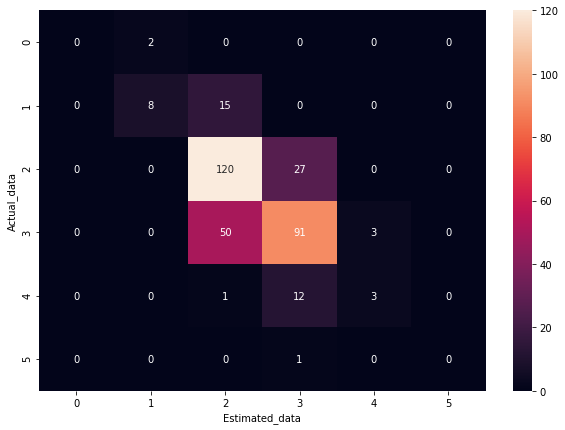

In [17]:
cm= confusion_matrix(y_test,y_pred_final)
plt.figure(figsize = (10,7))
sns.heatmap(cm,annot = True,  fmt='g')
plt.xlabel('Estimated_data')
plt.ylabel('Actual_data')

The heat map above shows a 6x6 confusion matrix which indicates the scores of the actual data and the estimated data. As it can be observed from the heatmap, the bright part of the map has more overlapping numbers/scores meaning that the predicted data had 120 correct outputs. This shows that even though the data explained_variance_score has a low score, the heat map highlights that the estimated data had decent amount of correct prediction scores. 

In [18]:
report = classification_report(y_test,y_pred_final)
print(report)

              precision    recall  f1-score   support

           1       0.00      0.00      0.00         2
           2       0.80      0.35      0.48        23
           3       0.65      0.82      0.72       147
           4       0.69      0.63      0.66       144
           5       0.50      0.19      0.27        16
           6       0.00      0.00      0.00         1

    accuracy                           0.67       333
   macro avg       0.44      0.33      0.36       333
weighted avg       0.66      0.67      0.65       333



The report above shows the precusion and the accuracy of the data produced from the machine learning model. As we observe the accuracy score, it shows 67% which is frequently good considering the fact that the original data has not being wrangled. 

In [19]:
lst = []
count = 1
for i in y_pred_real: 
    lst.append([round(i)])
    count += 1

In [20]:
lsts = []
count = 1
for i in df_sub["essayid"]:
    lsts.append([i])
    count += 1

In [21]:
lists = []
count = 1
for i in range(len(df_sub["essayid"])):
    lists.append([*lsts[i], *lst[(i)]])
    count+=1


In [22]:
# Write to a csv file
import csv
with open('32729286-DaisukeMurakami-2.csv', 'w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(["essayID", "score"])
    writer.writerows(lists)
    

# What is Quadratic Weighted Kappa (QWK)

The QWK is mostly used when giving a score based on the measures the agreement between the two ratings. It mostly varies from score of 0 to score of 1. This score is calculated by comparing hte expected or the known data and the predicted data. For example, in Kaggle, we submit the predicted data as a csv file and the algorithm read through the submited file with the answer file and compare and provide a score on how well the data in the files are matching. So, if the predicted data was completely the same as the expected data, the QWK will give a 1.0 meaning 100% preciseness to the scores.

To show this, below I have adapted cohen_kappa_score as cks form the sklearn.metrics library. This compares the predicted file that I have made from the SVM linear regression model with the test file that was provided previously. 

In [23]:
cks(y_pred_final, y_test, labels=None, weights="quadratic", sample_weight=None)

0.5987414647208462

# Evaluation of the output 

As it can be observed from the QWK score above, the overall score was around 60%, which is a decent score but could have been improved. Since this assignment wasn't meant to wrangle the data, there existed some data that influenced the linear regression method dramatically, due to the outliers that were left out without being removed. 

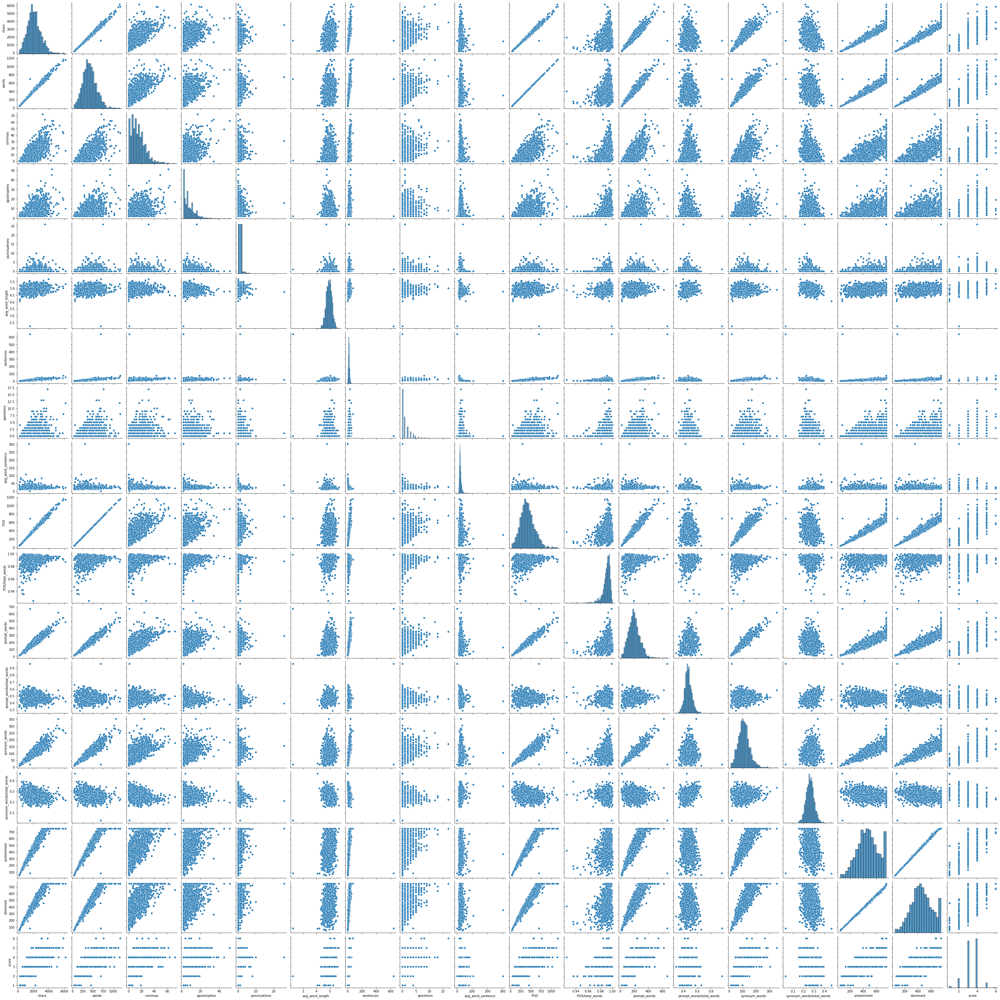

In [24]:
sns.pairplot(df2)

As the above plots show, there are some outliers that can be seen in some of the pairs of data. For example, punctuation has a outlier that almost has a difference of 15, and sentences also has an outlier where it is place more than 200 away from the group of plots. The reason why outliers have a major negative impact towards the whole prediction of the outcome is because they increase most of the components of the central tendancies such as, mean, standard deviation and median. Thus, when analysing the data, outliers need to be carefully evaluated so the the overall estimates of the data will not be influenced negatively.

In order to prevent this, the following code can be performed:

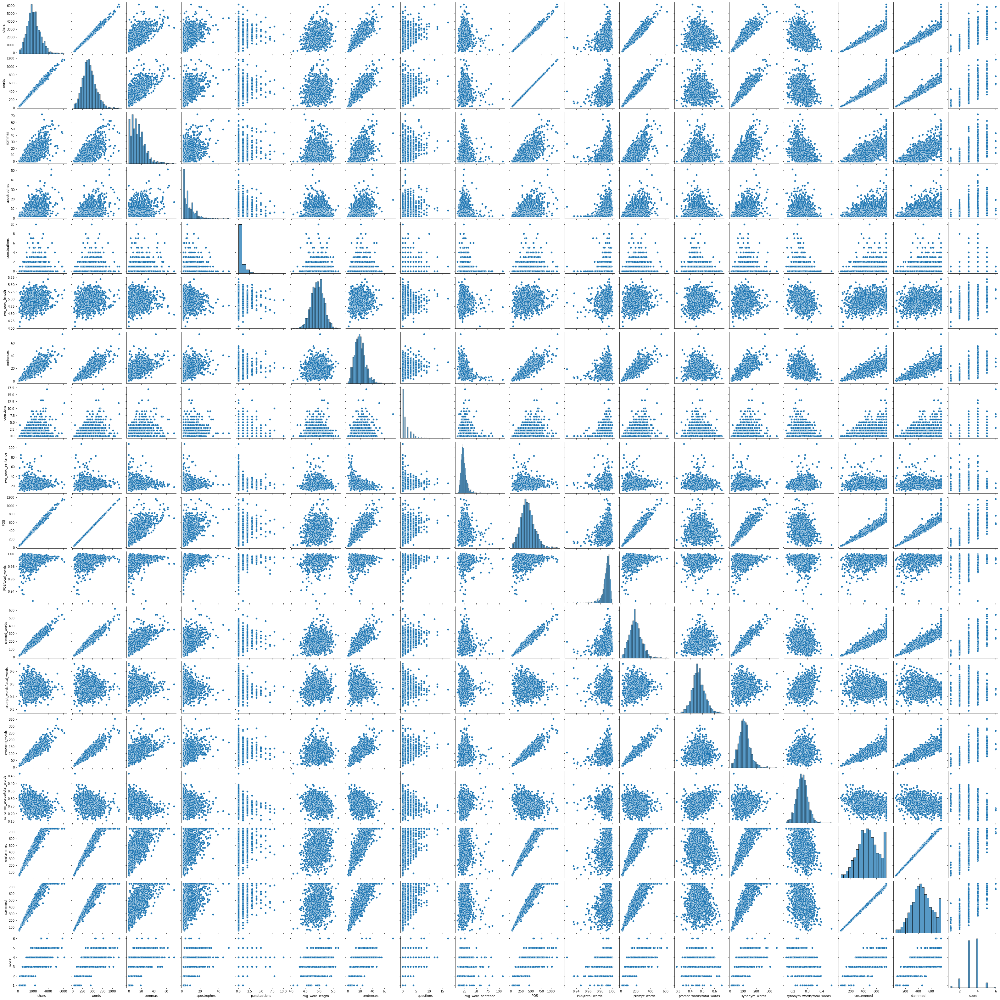

In [25]:
df2 = df2[df2['punctuations'] <15]
df2 = df2[df2['sentences'] <200]
df2 = df2[df2['avg_word_sentence'] < 200]
sns.pairplot(df2)

# Conclusion
To conclude, this report has provided suitable steps to analyse and visualize the data by describing the dataframes, classifying, clustrering, predicting, and adapting proper metrics to evaluate the scores on the predicted outcome. However, the provided data could have been interpretted and analysized indepth to adapt to the linear regression without creating much erros. 